# Boosting Technique

- Boosting is an ensemble modelling technique that attempts to build a trong classifier from the number of weak classifiers

- A node with two leaves (depth = 1) is known as a stump

$\rightarrow$ Adaboost: Forest of Stump (Forest of Weak Classifers)

- Each tree in the random forest has equal votes (weights) on the final decision
- Stump are not equally weighted in the final decision
- Stump that create more error will have less contribution in the final decision

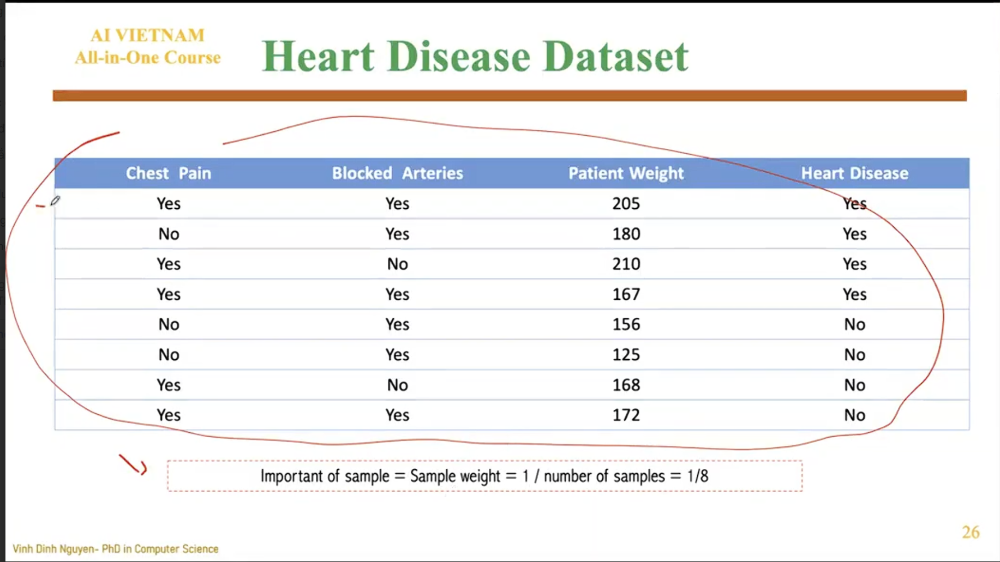

# AdaBoost

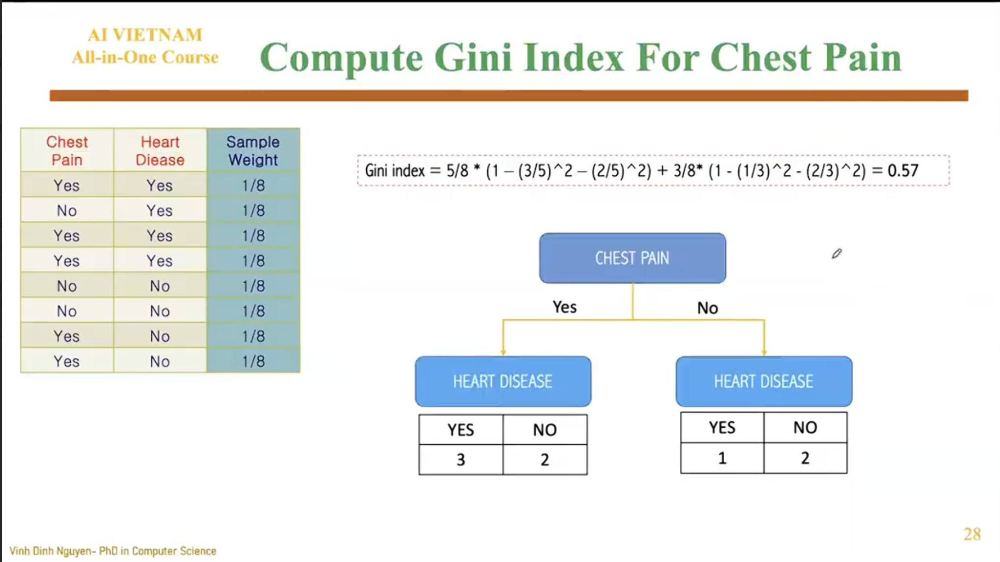

- Compute similarly for other features for choosing the feature for root node (The stump) and choose the smallest gini value

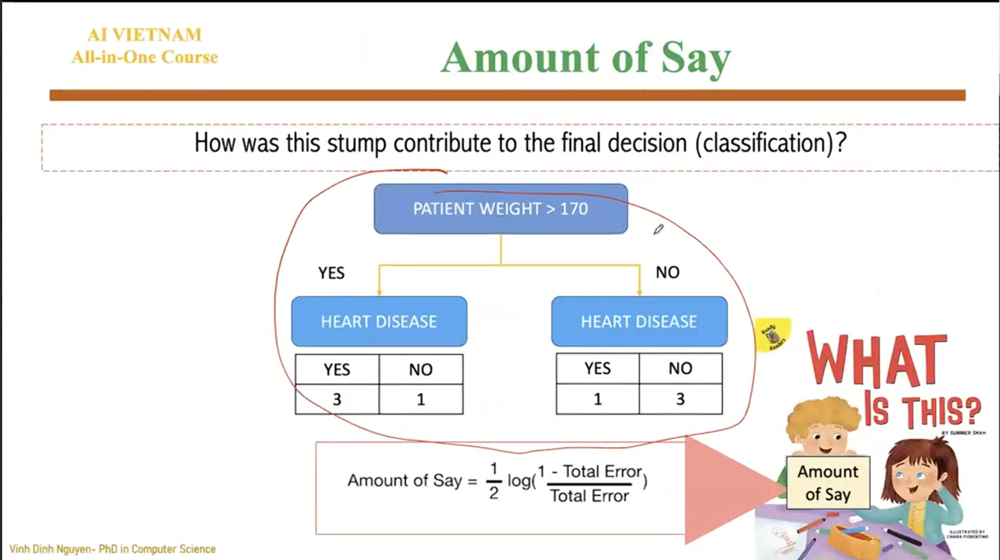

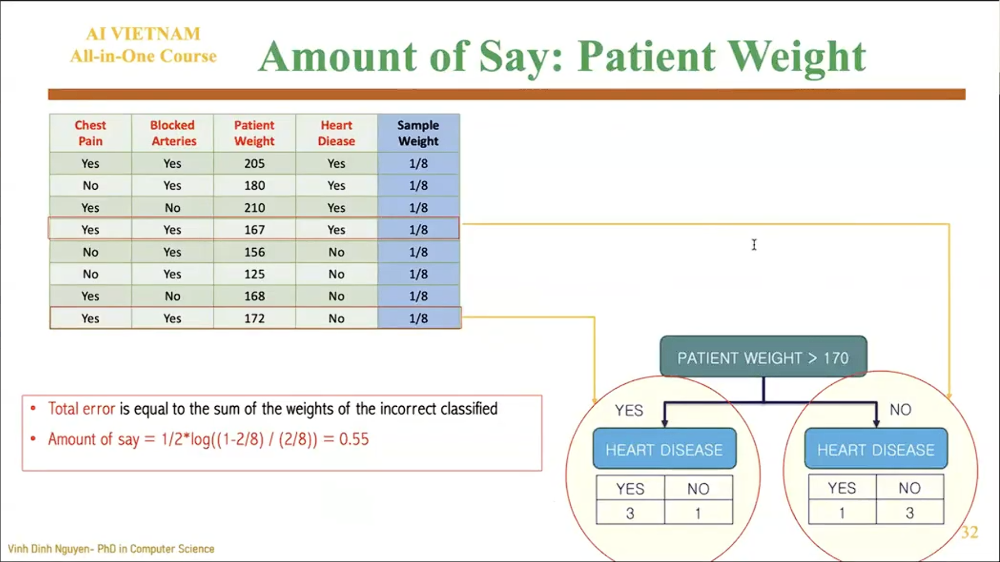

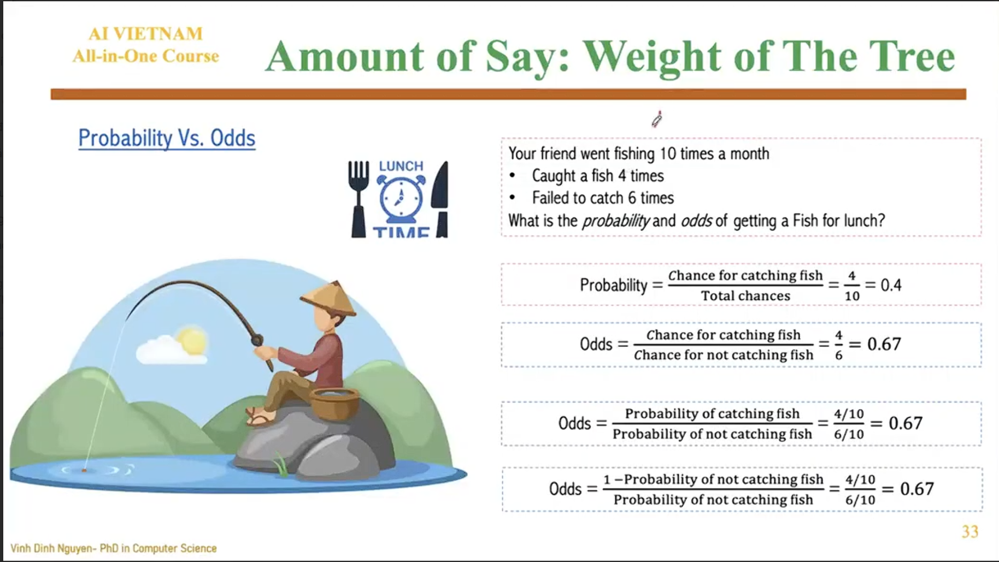

- Assumptions: 
    - Known: Weight cho các sample dự đoán sai được sử dụng để tính 'Amoung of Say' cho từng Stump hiện tại
    - Unknown: Tiếp theo, chúng ta cần làm thế nào để sử dụng thông tin các weight của sample dự đoán sai này để xây dựng stump tiếp và khắc phục các dự đoán sai này

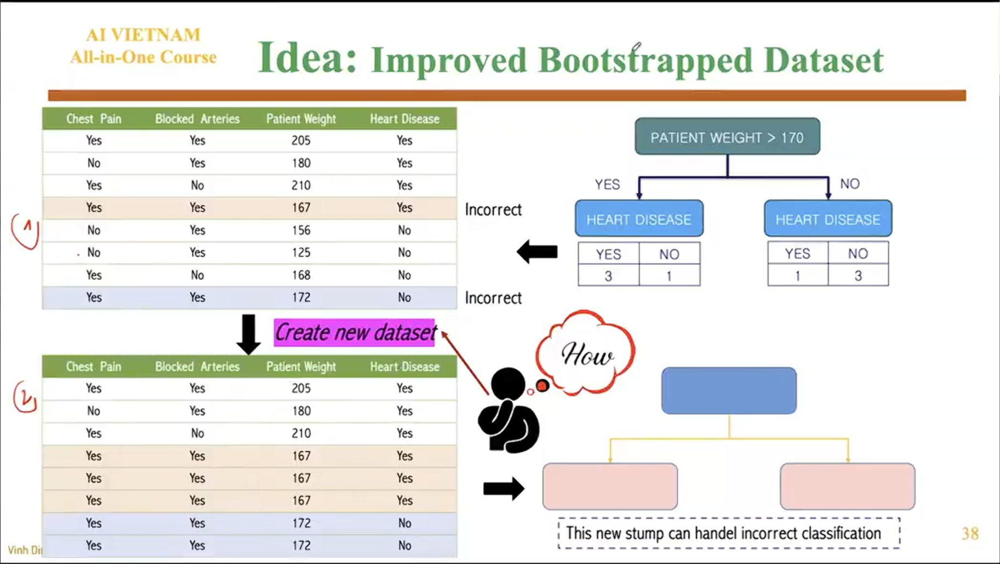

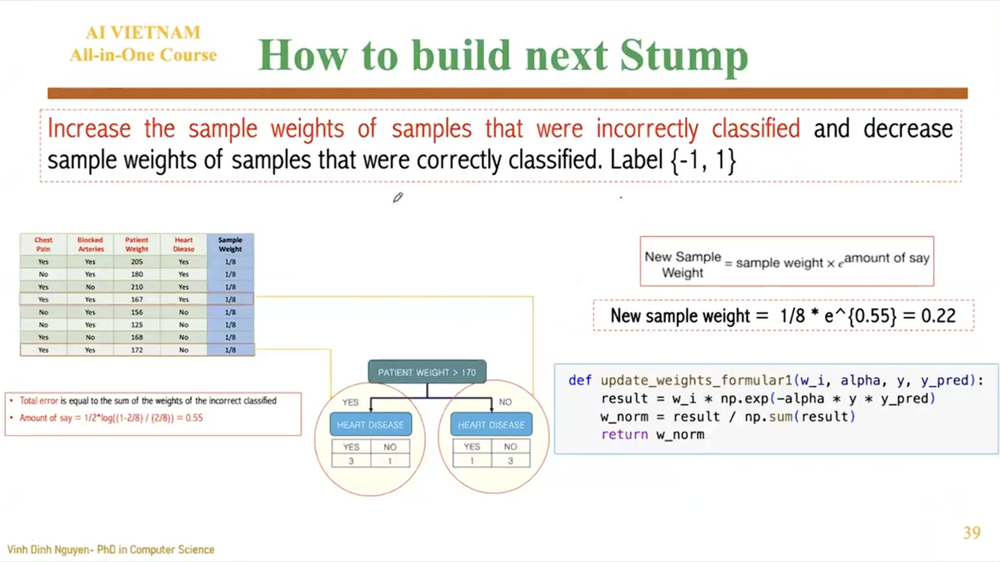

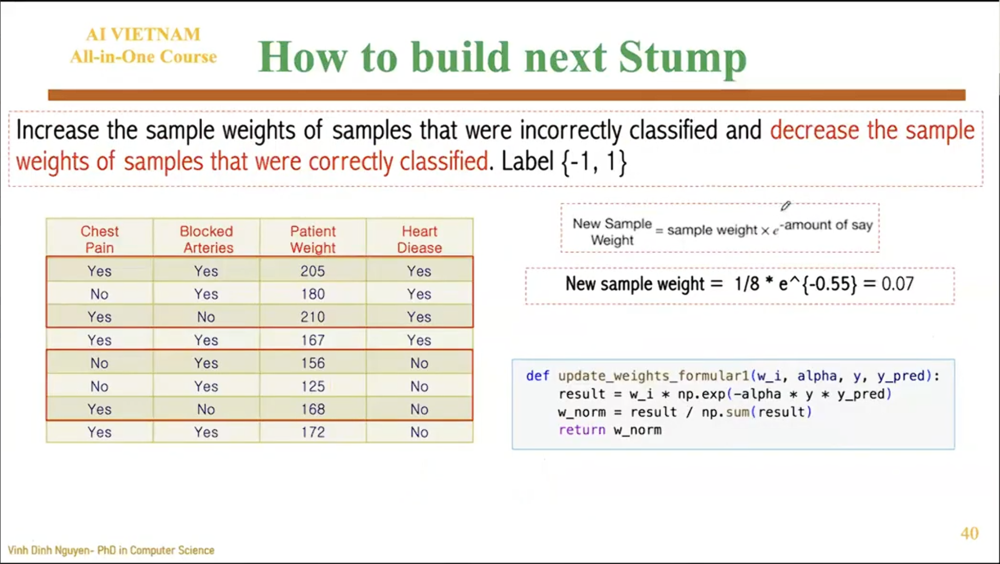

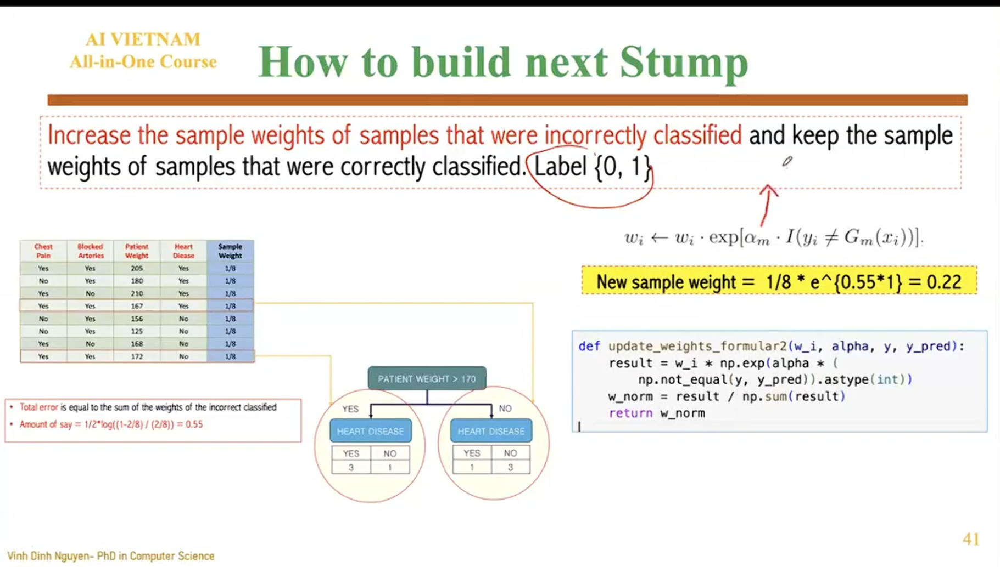

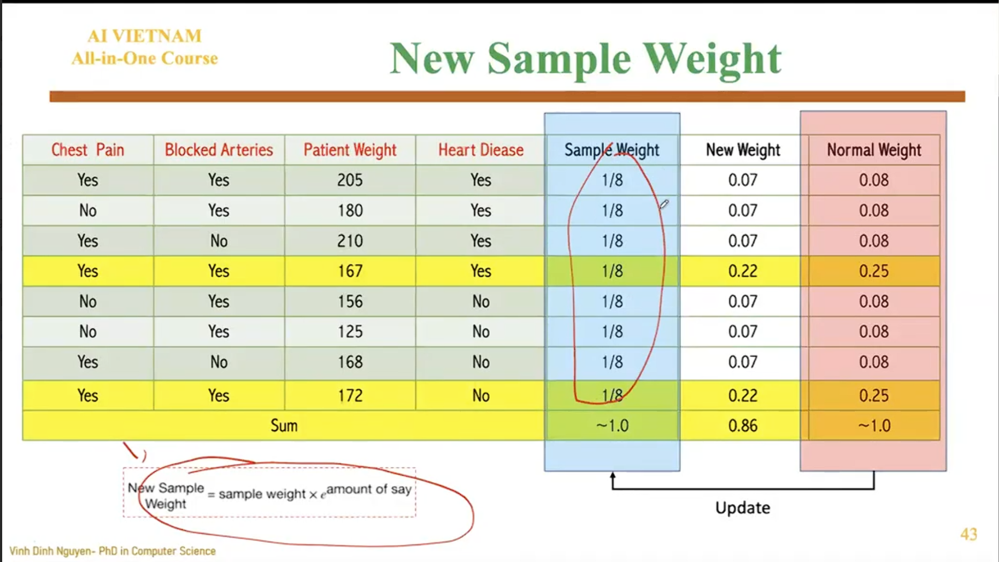

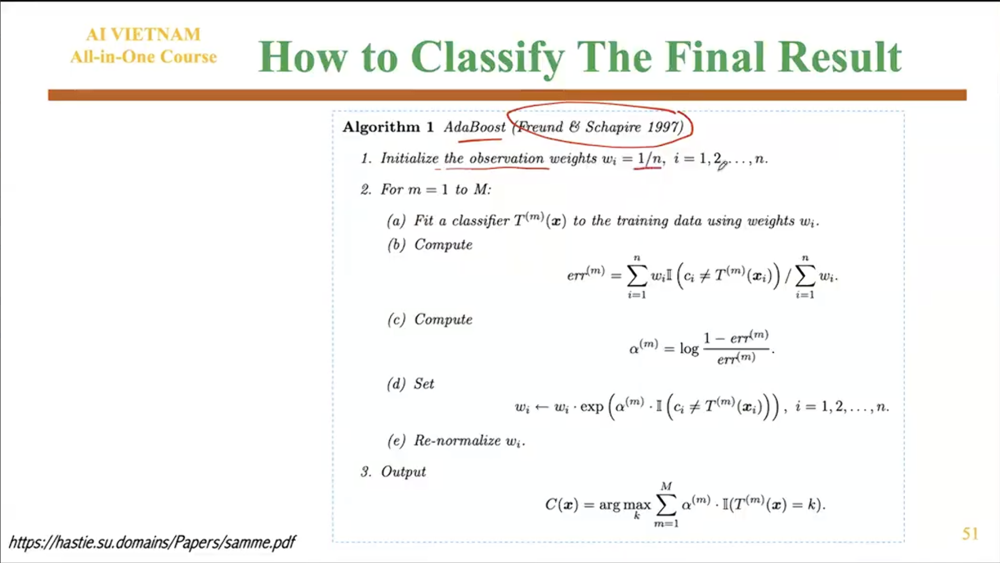

**1. Khởi tạo (Initialize)**

- Công thức: $w_i = 1/n, i = 1, 2, ..., n$
- Ý nghĩa: Ban đầu, tất cả các điểm dữ liệu (samples) đều quan trọng như nhau. Mỗi điểm được gán một trọng số bằng nhau là $1/n$ (với $n$ là tổng số lượng mẫu).

**2. Vòng lặp huấn luyện (For m = 1 to M)**

- Thuật toán sẽ thực hiện $M$ vòng lặp để tạo ra $M$ mô hình con (weak learners).

(a) Huấn luyện mô hình con (Fit a classifier)
- Hành động: Xây dựng một mô hình phân loại $T^{(m)}(x)$ dựa trên dữ liệu, nhưng có tính đến trọng số $w_i$. Những mẫu có trọng số $w_i$ lớn sẽ được mô hình ưu tiên phân loại đúng hơn.

(b) Tính lỗi của mô hình (Compute error)
- Công thức: $err^{(m)} = \sum_{i=1}^n w_i \mathbb{I}(c_i \neq T^{(m)}(x_i)) / \sum_{i=1}^n w_i$
- Giải thích:
    - $\mathbb{I}(\dots)$: Là hàm chỉ thị (indicator function). Nó trả về 1 nếu điều kiện trong ngoặc đúng (dự đoán sai: $c_i \neq T^{(m)}$), và trả về 0 nếu dự đoán đúng.
    - Về bản chất, đây là tổng trọng số của các mẫu bị dự đoán sai chia cho tổng trọng số của toàn bộ mẫu.

(c) Tính hệ số tin cậy (Compute $\alpha$)
- Công thức: $\alpha^{(m)} = \log \frac{1 - err^{(m)}}{err^{(m)}}$
- Ý nghĩa: Đây là "quyền lực" hay "trọng lượng lá phiếu" của mô hình thứ $m$.
    - Nếu lỗi $err$ nhỏ (mô hình giỏi) $\rightarrow$ phân số $(1-err)/err$ sẽ rất lớn $\rightarrow$ $\alpha$ lớn.
    - Nếu lỗi $err$ cao (mô hình dở) $\rightarrow$ $\alpha$ sẽ nhỏ (hoặc thậm chí âm nếu tệ hơn cả đoán mò).
    - Tóm lại: Mô hình nào giỏi sẽ có tiếng nói lớn hơn trong quyết định cuối cùng.

(d) Cập nhật trọng số (Set $w_i$) - Bước quan trọng nhất
- Công thức: $w_i \leftarrow w_i \cdot \exp(\alpha^{(m)} \cdot \mathbb{I}(c_i \neq T^{(m)}(x_i)))$
- Cơ chế hoạt động:
    - Nếu mẫu $i$ bị dự đoán SAI: Hàm $\mathbb{I} = 1$. Trọng số mới = $w_i \cdot e^{\alpha}$. Vì $\alpha > 0$ (với mô hình tốt hơn ngẫu nhiên), nên $e^{\alpha} > 1$. $\rightarrow$ Trọng số $w_i$ tăng lên. Lần sau mô hình sẽ phải chú ý nó hơn.
    - Nếu mẫu $i$ được dự đoán ĐÚNG: Hàm $\mathbb{I} = 0$. Trọng số mới = $w_i \cdot e^0 = w_i \cdot 1$. Trọng số giữ nguyên (về mặt giá trị tuyệt đối trước khi chuẩn hóa).
    - Lưu ý: Việc tăng trọng số mẫu sai đồng nghĩa với việc mẫu đúng sẽ trở nên ít quan trọng hơn một cách tương đối sau bước (e).

(e) Chuẩn hóa lại (Re-normalize)
- Chia tất cả $w_i$ cho tổng của chúng để đảm bảo tổng trọng số luôn bằng 1, giữ đúng tính chất phân phối xác suất.

**3. Kết quả đầu ra (Output)**
- Công thức: $C(x) = \arg\max_k \sum_{m=1}^M \alpha^{(m)} \cdot \mathbb{I}(T^{(m)}(x) = k)$
- Ý nghĩa (Cơ chế bỏ phiếu có trọng số):
    - Để dự đoán nhãn cho một dữ liệu mới $x$, thuật toán sẽ hỏi ý kiến tất cả $M$ mô hình con.
    - Nếu mô hình $m$ dự đoán lớp $k$, nó sẽ đóng góp $\alpha^{(m)}$ điểm vào rổ của lớp $k$.
    - Lớp nào ($k$) có tổng điểm cao nhất ($\arg\max$) sẽ được chọn làm kết quả cuối cùng.

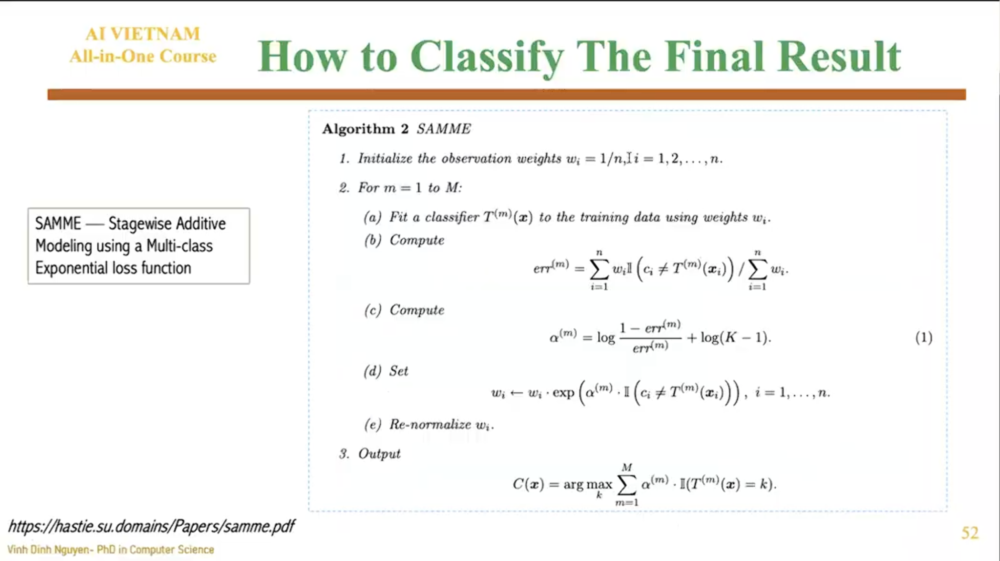

- Đây là một biến thể quan trọng của AdaBoost được thiết kế đặc biệt để giải quyết bài toán Phân loại đa lớp (Multi-class Classification) (khi số lượng lớp $K > 2$).

**1. Khởi tạo (Initialize)**

- Công thức: $w_i = 1/n, i = 1, 2, ..., n$
- Ý nghĩa: Tương tự AdaBoost chuẩn, ban đầu tất cả các mẫu dữ liệu đều có trọng số ngang nhau.

**2. Vòng lặp huấn luyện (For m = 1 to M)**

(a) & (b) Huấn luyện và Tính lỗi (Fit classifier & Compute error)
- Các bước này giống hệt AdaBoost nhị phân (Binary AdaBoost). Mô hình con $T^{(m)}(x)$ được huấn luyện để giảm thiểu lỗi trên dữ liệu có trọng số, và lỗi $err^{(m)}$ là tổng trọng số của các mẫu bị dự đoán sai.

(c) Tính hệ số tin cậy $\alpha^{(m)}$ (Điểm khác biệt quan trọng nhất)
Đây là trái tim của thuật toán SAMME.
- Công thức:
$$\alpha^{(m)} = \log \frac{1 - err^{(m)}}{err^{(m)}} + \log(K - 1)$$
- Giải thích chi tiết:
    - Trong AdaBoost chuẩn (chỉ có 2 lớp), công thức chỉ là phần đầu: $\log((1-err)/err)$.
    - Trong SAMME, ta cộng thêm $\log(K-1)$, với $K$ là số lượng lớp (classes).
    - Tại sao cần cộng thêm?
        - Nếu phân loại 2 lớp, đoán mò (ngẫu nhiên) sẽ sai 50% ($err = 0.5$). Để mô hình có ích ($\alpha > 0$), $err$ phải nhỏ hơn 0.5.
        - Nếu phân loại $K=10$ lớp, đoán mò sẽ sai tới 90% ($err = 0.9$). Một mô hình có lỗi $err = 0.7$ (sai 70%) thực ra tốt hơn nhiều so với đoán mò. Nhưng nếu dùng công thức cũ, $err=0.7$ sẽ cho ra $\alpha$ âm (bị coi là mô hình tệ).
        - Thành phần $\log(K-1)$ giúp nới lỏng ngưỡng đánh giá. Miễn là mô hình tốt hơn ngẫu nhiên ($err < 1 - 1/K$), thì $\alpha$ sẽ dương.
    - Trường hợp đặc biệt: Nếu $K=2$, thì $\log(2-1) = \log(1) = 0$. Công thức quay về giống hệt AdaBoost chuẩn.

(d) Cập nhật trọng số (Update weights)
- Công thức:
$$w_i \leftarrow w_i \cdot \exp \left( \alpha^{(m)} \cdot \mathbb{I}(c_i \neq T^{(m)}(x_i)) \right)$$
- Cơ chế:
    - Vẫn giữ nguyên nguyên tắc: Mẫu sai thì tăng trọng số, mẫu đúng giữ nguyên (trước khi chuẩn hóa).
    - Tuy nhiên, mức độ tăng trọng số giờ đây phụ thuộc vào $\alpha^{(m)}$ mới (đã bao gồm yếu tố số lượng lớp $K$).

(e) Chuẩn hóa (Re-normalize)
- Đảm bảo tổng trọng số bằng 1 để tiếp tục vòng lặp sau.

**3. Kết quả đầu ra (Output)**

- Công thức:
$$C(x) = \arg\max_k \sum_{m=1}^M \alpha^{(m)} \cdot \mathbb{I}(T^{(m)}(x) = k)$$
- Ý nghĩa:
    - Thay vì chỉ cộng trừ (như trong nhị phân +1/-1), ở đây thuật toán dùng cơ chế Bỏ phiếu có trọng số (Weighted Voting) cho từng lớp $k$.
    - Mỗi mô hình con $m$ sẽ bỏ phiếu cho lớp mà nó dự đoán. Phiếu của nó có giá trị bằng $\alpha^{(m)}$.
    - Lớp $k$ nào nhận được tổng điểm cao nhất từ tất cả các mô hình con sẽ được chọn làm kết quả cuối cùng.

Đây là cách người ta chứng minh AdaBoost thực chất là quy trình tối ưu hóa một hàm mất mát cụ thể theo từng giai đoạn.

**1. Hàm giả thuyết (Hypothesis function)**
- Công thức:
$$f(x) = \sum_{m=1}^M \alpha_m * G_m(x)$$
- Giải thích:
    - Đây là mô hình cuối cùng của AdaBoost.
    - Nó là tổng cộng dồn của $M$ mô hình con ($G_m(x)$). (Lưu ý: Trong hình trước ký hiệu là $T^{(m)}$, ở đây ký hiệu là $G_m$, chúng là một).
    - Mỗi mô hình con được nhân với một trọng số $\alpha_m$ (độ tin cậy).
    - Nhãn dự đoán $y$ nằm trong tập $\{-1, 1\}$.

**2. Hàm mất mát mũ (Exponential loss function)**
- Công thức:
$$Err(f) = \sum_{i=1}^N e^{-y_i * f(x_i)}$$
- Tại sao dùng hàm này ? Đây là chìa khóa của Adaboost
    - $y_i$ là nhãn thực tế ($\pm 1$), $f(x_i)$ là giá trị dự đoán.
    - Nếu đoán ĐÚNG: $y_i$ và $f(x_i)$ cùng dấu $\rightarrow$ tích $y_i * f(x_i) > 0$ $\rightarrow$ số mũ $-y*f$ là số âm $\rightarrow$ $e^{\text{số âm}}$ rất nhỏ (Lỗi thấp).
    - Nếu đoán SAI: $y_i$ và $f(x_i)$ trái dấu $\rightarrow$ tích $y_i * f(x_i) < 0$ $\rightarrow$ số mũ $-y*f$ là số dương $\rightarrow$ $e^{\text{số dương}}$ rất lớn (Lỗi cao).
    - Hàm này phạt rất nặng các trường hợp đoán sai.

**3. Giả sử mô hình cộng dồn (Supposing that...)**
- Công thức:    
$$f_m(x) = f_{m-1}(x) + \alpha_m * G_m(x)$$
- Ý nghĩa:
    - Chúng ta không tìm toàn bộ $f(x)$ ngay lập tức.
    - Chúng ta xây dựng nó từng bước (Step-by-step).
    - Mô hình ở bước hiện tại ($m$) = Mô hình ở bước trước ($m-1$) + Mô hình con mới tìm được ($\alpha G$).

**4. Khai triển hàm lỗi**

Người ta thay thế công thức $f_m(x)$ ở bước 3 vào công thức hàm lỗi ở bước 2:
- Biến đổi toán học
$$Err(f) = \sum_{i=1}^N e^{-y_i (f_{m-1}(x_i) + \alpha_m G_m(x_i))}$$
$$= \sum_{i=1}^N \underbrace{e^{-y_i f_{m-1}(x_i)}}_{\text{Phần cũ}} * \underbrace{e^{-y_i \alpha_m G_m(x_i)}}_{\text{Phần mới}}$$

- Định nghĩa trọng số $w_i$:
$$w_i = e^{-y_i f_{m-1}(x_i)}$$
- Đại lượng này không phụ thuộc vào $\alpha_m$ và $G_m$ (vì nó là kết quả của quá khứ).
- Nó chính là "lỗi tích lũy" của các bước trước đối với mẫu dữ liệu $i$.
- Nếu các bước trước đoán sai nhiều, số mũ sẽ dương lớn $\rightarrow$ $w_i$ lớn.

- Kết luận
$$Err(\alpha_m, G_m) = \sum_{i=1}^N w_i * e^{-y_i \alpha_m G_m(x_i)}$$

$\rightarrow$ Việc tìm mô hình con mới ($G_m$) và hệ số của nó ($\alpha_m$) chính là đi tìm cách giảm thiểu lỗi trên dữ liệu đã được gán trọng số $w_i$.



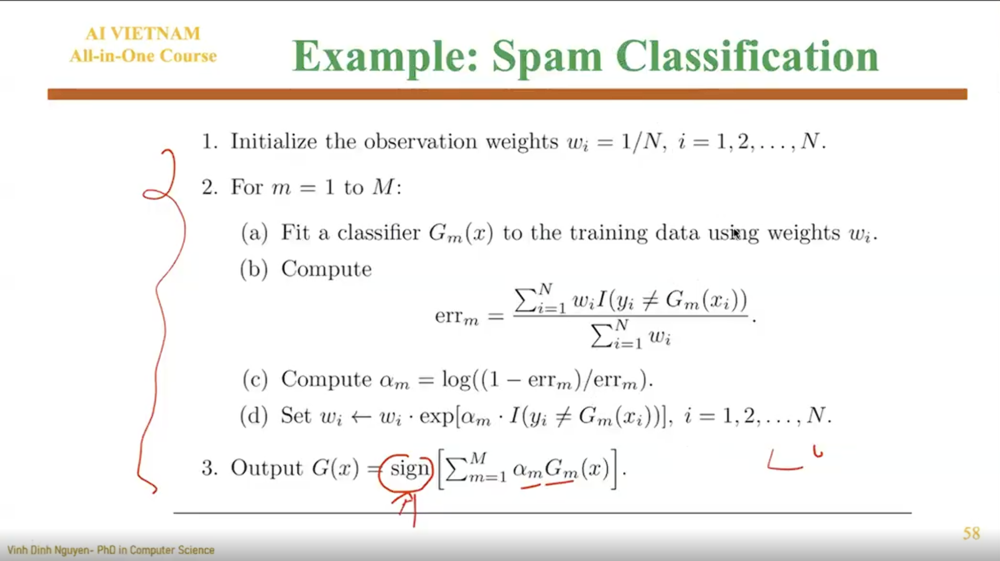

$$err^{(m)} = \frac{\sum_{i=1}^n w_i \cdot \mathbb{I}(c_i \neq T^{(m)}(x_i))}{\sum_{i=1}^n w_i}$$

In [1]:
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier

# Helper functions
def compute_error(y, y_pred, w_i):
    '''
    Calculate the error rate of a weak classifier m. Arguments:
    y: actual target value
    y_pred: predicted value by weak classifier
    w_i: individual weights for each observation
    '''

    # 1. Tìm các mẫu dự đoán sai
    incorrect_predictions = (y != y_pred)

    # 2. Tính tử số: Tổng trọng số của những mẫu sai
    sum_weighted_error = np.sum(w_i * incorrect_predictions)

    # 3. Tính mẫu số: Tổng tất cả các trọng số
    total_weights = np.sum(w_i)

    return sum_weighted_error / total_weights

$$\alpha^{(m)} = \log \frac{1 - err^{(m)}}{err^{(m)}}$$

In [2]:

def compute_alpha(error):
    epsilon = 0.01
    return np.log((1-error + epsilon) / (error + epsilon))

$$w_i \leftarrow w_i \cdot \exp(\alpha^{(m)} \cdot \mathbb{I}(c_i \neq T^{(m)}(x_i)))$$

In [7]:
def update_and_normalize_weights(w_i, alpha, y, y_pred):
    '''Cập nhật và chuẩn hóa trọng số'''
    # 1. Cập nhật: w_new = w_old * exp(alpha * I(y != y_pred))
    is_incorrect = (y != y_pred).astype(int)
    w_new = w_i * np.exp(alpha * is_incorrect)
    
    # 2. Chuẩn hóa: w = w / sum(w)
    return w_new / np.sum(w_new)

In [8]:
class AdaBoost:
    def __init__(self):
        self.alphas = []
        self.G_M = []
        self.M = None
        self.training_errors = []
        self.prediction_errors = []
    
    def fit(self, X, y, M = 100):
        
        # Clear data before calling
        self.alphas = []
        self.training_errors = []
        self.G_M = []
        self.M = M

        # B1: Khởi tạo trọng số đều nhau
        n_samples = len(y)
        w_i = np.ones(len(y)) / n_samples

        # B2: Iteration
        for m in range(M):

            # (a) Fit a classifer T(x) using weights w_i
            # Sử dụng Decision Stump
            G_m = DecisionTreeClassifier(max_depth=1)
            G_m.fit(X, y, sample_weight=w_i)
            y_pred = G_m.predict(X)

            # (b) Compute error
            err_m = compute_error(y, y_pred, w_i)

            # (c) Nếu err = 0 hoặc err >= 0.5 (Tệ hơn đoán mò, cần xử lý)
            err_m = np.clip(err_m, 1e-10, 1 - 1e-10)

            # (c) Compute alpha
            alpha_m = compute_alpha(err_m)

            self.G_M.append(G_m)
            self.alphas.append(alpha_m)
            self.training_errors.append(err_m)

            # (d) Update and Normalize weights
            w_i = update_and_normalize_weights(w_i, alpha_m, y, y_pred)
    
    def predict(self, X):
        '''
        Dự đoán kết quả cho dữ liệu mới.
        Công thức: sign( sum(alpha_m * G_m(x)) )
        '''
        # Tạo mảng chứa dự đoán của tất cả mô hình con
        # Shape: (Số mẫu, Số mô hình con)
        weak_preds = pd.DataFrame(index=range(len(X)), columns=range(self.M))

        for m in range(self.M):
            y_pred_m = self.G_M[m].predict(X)
            # Quan trọng: Nếu nhãn là {0, 1}, cần đổi về {-1, 1} để tính tổng trọng số
            # Nếu nhãn gốc của bạn đã là {-1, 1} thì bỏ bước convert này
            # y_pred_m = np.where(y_pred_m == 0, -1, 1)

            weak_preds.iloc[:, m] = y_pred_m * self.alphas[m]
        
        y_pred_final = (1 * np.sign(weak_preds.T.sum())).astype(int)

        return y_pred_final